---

**Przedmiot:** Uczenie Głębokie<br>
**Moduł:** 3<br>
**Laboratoria:** 8<br>
**Opis laboratoriów:** Poniższy skrypt omawia architekturę **CLIP** (_Contrastive Language-Image Pre-training_). W przeciwieństwie do tradycyjnych klasyfikatorów uczonych na zamkniętym zbiorze etykiet, CLIP uczy się dopasowywać obrazy do ich opisów tekstowych w przestrzeni zanurzeń (_embeddings_) poprzez tzw. _contrastive loss_. Pozwala to na elastyczną klasyfikację typu _zero-shot_ oraz sterowanie modelami generatywnymi za pomocą tekstu (tzw. promptów).

Wagi modelu są dostępne [na Dysku Google](https://drive.google.com/file/d/15L2HPhDMF55_vGUh90MEgu6qz5OAkiiK/view?usp=sharing), są automatycznie pobierane poniżej.

---


# Funkcje pomocnicze

In [ ]:
import sys
import random
import numpy as np
import torch
from torch import nn
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader
from datasets import load_dataset
from transformers import DistilBertModel, DistilBertTokenizer
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
from IPython.display import display, Markdown
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid

In [ ]:
torch.set_float32_matmul_precision("high")
torch.backends.cudnn.benchmark = True

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IN_COLAB = 'google.colab' in sys.modules

%load_ext tensorboard

/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


In [ ]:
!gdown https://drive.google.com/uc?id=15L2HPhDMF55_vGUh90MEgu6qz5OAkiiK
!unzip -o ./clip.zip
!rm ./clip.zip

Downloading...
From: https://drive.google.com/uc?id=15L2HPhDMF55_vGUh90MEgu6qz5OAkiiK
To: /content/clip.zip
100% 3.18M/3.18M [00:00<00:00, 245MB/s]
Archive:  ./clip.zip
   creating: logs/
   creating: logs/clip/
  inflating: logs/clip/checkpoint_59.pth  
  inflating: logs/clip/events.out.tfevents.1768360862.Atlas.7960.0  


# CLIP (_Contrastive Language-Image Pre-training_)

**CLIP** (*Contrastive Language-Image Pre-training*) to przełomowe podejście zaprezentowane przez OpenAI w 2021 roku. W przeciwieństwie do klasycznych klasyfikatorów trenowanych na zbiorach ze ściśle zdefiniowanymi etykietami (np. _ImageNet_), CLIP jest uczony poprzez analizę dużej liczby par w postaci _**(obraz, opis tekstowy)**_.

Kluczową ideą jest tu **wspólna przestrzeń zanurzeń** (*joint embedding space*). Model uczy się rzutować obrazy i tekst do tej samej przestrzeni wektorowej w taki sposób, aby pasujący do siebie obraz i opis znajdowały się blisko siebie (żeby odległość cosinusowa była jak najmniejsza), a niepasujące – daleko.

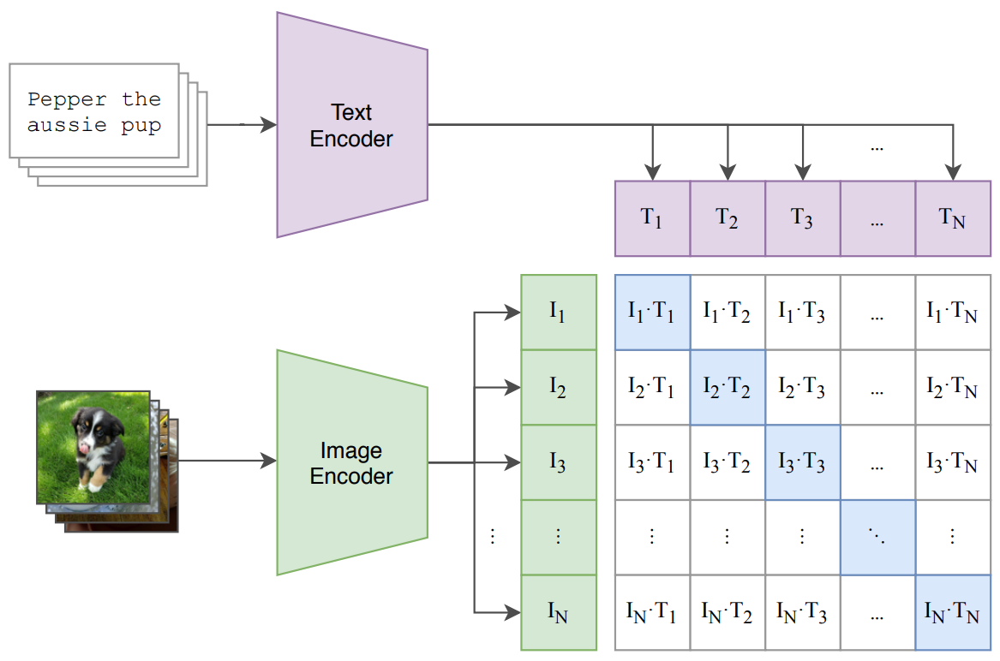

(Źródło obrazka: Alec Radford et al. _Learning Transferable Visual Models From Natural Language Supervision._ ICML 2021.)

Autorzy wykazali również, że model wytrenowany na ogromnym zbiorze danych par _(obraz, tekst)_ może działać jako **uniwersalny klasyfikator**. Warto np. zauważyć, że CLIP klasyfikuje obrazy ze zbioru **ImageNet** lepiej niż ówczesne modele SOTA (_State-Of-The-Art_), które były trenowane i optymalizowane bezpośrednio na tym konkretnym zbiorze danych.

## Architektura

CLIP składa się z dwóch niezależnych enkoderów:

1.  **Image Encoder**: Przetwarza obraz wejściowy na wektor cech. Może to być ResNet lub Vision Transformer (ViT).
2.  **Text Encoder**: Przetwarza tekst wejściowy na wektor cech. Jest to zazwyczaj Transformer (podobny do BERTa), który operuje na sekwencji tokenów.

Dla danej pary (obraz $I$, tekst $T$), enkodery generują odpowiadające im wektory reprezentacji $E_I$ oraz $E_T$. Aby móc je porównać, oba wektory są rzutowane liniowo do przestrzeni o tym samym wymiarze $d$.

# Ładowanie zbioru danych

Aby nauczyć model wspólnej reprezentacji dla obrazu i tekstu, niezbędne są dane multimodalne w postaci sparowanych przykładów. W tym laboratorium wykorzystamy zbiór **Flickr30k**.

Zbiór ten zawiera **31,8 tys. obrazów** pozyskanych z serwisu Flickr, z których każdy posiada odpowiadające mu opisy tekstowe. Naszym celem będzie zakodowanie zarówno obrazów, jak i podpisów do postaci wektorowej. Warto zauważyć, że oryginalny CLIP był trenowany na 400 milionach par (zbiór WIT), a kolejne tego typu modele CLIP były trenowane na zbiorach o jeszcze większej liczbie przykładów:
- LAION-2B: 2 miliardy obrazów, ok. 100 TB
- WebLI: 10 miliardów obrazów, _bardzo dużo TB_

In [ ]:
INPUT_SIZE = 224
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

train_image_transforms = transforms.Compose([
    transforms.RandomResizedCrop(INPUT_SIZE, scale=(0.9, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

test_image_transforms = transforms.Compose([
    transforms.Resize(INPUT_SIZE),
    transforms.CenterCrop(INPUT_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

In [ ]:
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

def tokenize(text):
    tokenized = tokenizer(text, padding=True, truncation=True, max_length=128)
    for k in tokenized:
        tokenized[k] = torch.tensor(tokenized[k])
    return tokenized

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

In [ ]:
KEYS = ["pixel_values", "input_ids", "attention_mask"]

def transform_fn_train(examples):
    examples["pixel_values"] = [
        train_image_transforms(image.convert("RGB")) for image in examples["image"]
    ]
    del examples["image"]

    caption = [random.choice(captions) for captions in examples["caption"]]
    examples.update(tokenize(caption))
    return examples

def transform_fn_test(examples):
    examples["pixel_values"] = [
        test_image_transforms(image.convert("RGB")) for image in examples["image"]
    ]
    del examples["image"]

    caption = [captions[0] for captions in examples["caption"]]
    examples.update(tokenize(caption))
    return examples

In [ ]:
dataset = load_dataset("lmms-lab/flickr30k", split="test") \
    .train_test_split(test_size=0.1)

README.md: 0.00B [00:00, ?B/s]

data/test-00000-of-00009.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

data/test-00001-of-00009.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/test-00002-of-00009.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/test-00003-of-00009.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

data/test-00004-of-00009.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/test-00005-of-00009.parquet:   0%|          | 0.00/500M [00:00<?, ?B/s]

data/test-00006-of-00009.parquet:   0%|          | 0.00/528M [00:00<?, ?B/s]

data/test-00007-of-00009.parquet:   0%|          | 0.00/511M [00:00<?, ?B/s]

data/test-00008-of-00009.parquet:   0%|          | 0.00/477M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/31783 [00:00<?, ? examples/s]

In [ ]:
batch_size = 16 if IN_COLAB else 256

train_dataloader = DataLoader(dataset["train"].with_transform(transform_fn_train), batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(dataset["test"].with_transform(transform_fn_test), batch_size=batch_size, shuffle=False)

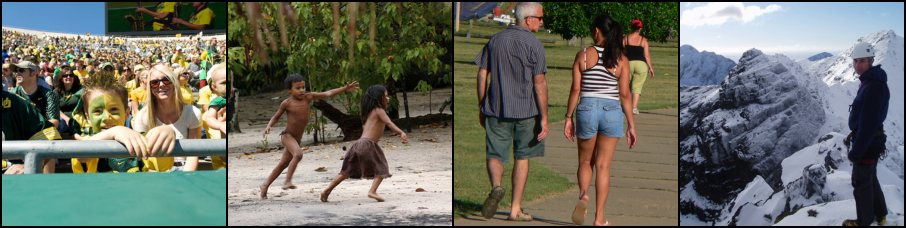

1. There is a crowd of sports fans  including a boy with a yellow and green painted face  in the front row of a stadium .

1. A little boy is running on the round playing with a little girl .

1. There is a man in shorts and sandals and a woman in blue jean shorts and flip-flops out walking together .

1. A man in a white helmet and dark clothing stands in the snowy mountains .

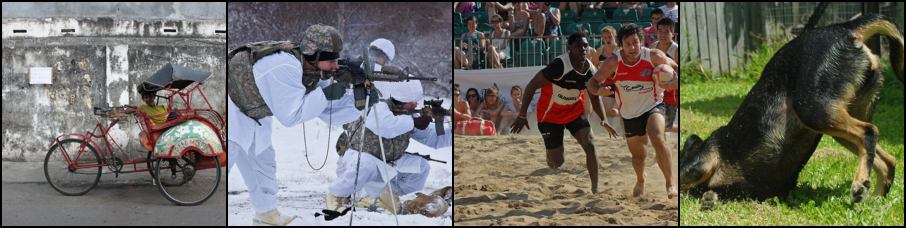

1. A man is sitting in the passenger seat of a red three-wheeled rickshaw .

1. Two winter hunters wearing all white with camouflage vests and helmets are looking through their rifles with some animal kills near them .

1. Four men are shown playing rugby on the beach in front of a crowd of spectators .

1. A brown and black dog is rubbing his face in the grass .

In [ ]:
inv_normalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
)

x = next(iter(val_dataloader))
imgs = inv_normalize(x["pixel_values"]).clamp(0, 1)

display(to_pil_image(make_grid(imgs[:4])))
display(Markdown(f"1. {'\n\n1. '.join([x['caption'][0][i] for i in range(4)])}"))

display(to_pil_image(make_grid(imgs[4:8])))
display(Markdown(f"1. {'\n\n1. '.join([x['caption'][0][i] for i in range(4, 8)])}"))


# Definicja modelu

### Enkoder dla obrazów

In [ ]:
class ImageEncoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        self.model.fc = nn.Identity()

        for p in self.model.parameters():
            p.requires_grad = False

        self.embedding_dim = 2048

    def forward(self, x):
        with torch.no_grad():
            return self.model(x)

### Enkoder dla tekstu

In [ ]:
class TextEncoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.model = DistilBertModel.from_pretrained("distilbert-base-uncased")

        for p in self.model.parameters():
            p.requires_grad = False

        self.target_token_idx = 0

        self.embedding_dim = 768

    def forward(self, input_ids, attention_mask):
        with torch.no_grad():
            output = self.model(input_ids=input_ids, attention_mask=attention_mask)
            last_hidden_state = output.last_hidden_state
            return last_hidden_state[:, self.target_token_idx, :]

In [ ]:
class ProjectionHead(nn.Module):
    def __init__(self, embedding_dim, projection_dim=256, dropout=0.1):
        super().__init__()
        self.projection = nn.Linear(embedding_dim, projection_dim)
        self.gelu = nn.GELU()
        self.fc = nn.Linear(projection_dim, projection_dim)
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(projection_dim)

    def forward(self, x):
        projected = self.projection(x)
        x = self.gelu(projected)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected
        x = self.layer_norm(x)
        return x

In [ ]:
class CLIPModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.image_encoder = ImageEncoder()
        self.text_encoder = TextEncoder()
        self.image_projection = ProjectionHead(embedding_dim=self.image_encoder.embedding_dim)
        self.text_projection = ProjectionHead(embedding_dim=self.text_encoder.embedding_dim)
        self.temperature = nn.Parameter(torch.ones([]) * np.log(1 / 0.07))

    def forward(self, batch):
        image_features = self.image_encoder(batch["pixel_values"])
        text_features = self.text_encoder(
            input_ids=batch["input_ids"], attention_mask=batch["attention_mask"]
        )

        image_emb = self.image_projection(image_features)
        text_emb = self.text_projection(text_features)

        return image_emb, text_emb, self.temperature

# Funkcja straty

In [ ]:
def clip_loss(image_emb, text_emb, t):
    logits = (image_emb @ text_emb.transpose(-2, -1)) * torch.exp(t)
    labels = torch.arange(logits.shape[0], device=device)
    loss_image = F.cross_entropy(logits.transpose(-2, -1), labels)
    loss_text = F.cross_entropy(logits, labels)
    return (loss_image + loss_text) / 2

# Uczenie modelu

In [ ]:
NUM_EPOCHS = 2 if IN_COLAB else 100

model = CLIPModel().to(device)
optimizer = torch.optim.AdamW(model.parameters())

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 193MB/s]


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [ ]:
writer = SummaryWriter(log_dir="logs/clip_colab")

for epoch in range(NUM_EPOCHS):
    model.train()
    model.image_encoder.eval()
    model.text_encoder.eval()

    train_losses = []

    pbar = tqdm(train_dataloader, desc=f"Epoch {epoch}/{NUM_EPOCHS}")
    for batch_idx, batch in enumerate(pbar):
        for k in KEYS:
            batch[k] = batch[k].to(device)

        optimizer.zero_grad()

        image_emb, text_emb, t = model(batch)

        loss = clip_loss(image_emb, text_emb, t)

        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())
        pbar.set_postfix({"loss": f"{np.mean(train_losses):.4f}"})

        if IN_COLAB and batch_idx >= 5:
            break

    model.eval()
    val_losses = []

    with torch.no_grad():
        for batch_idx,batch in enumerate(tqdm(val_dataloader)):
            for k in KEYS:
                batch[k] = batch[k].to(device)

            image_emb, text_emb, t = model(batch)

            loss = clip_loss(image_emb, text_emb, t)

            val_losses.append(loss.item())

            if IN_COLAB and batch_idx >= 5:
                break

    avg_train_loss = np.mean(train_losses)
    avg_val_loss = np.mean(val_losses)

    print(f"Epoch {epoch} | Average Loss: {avg_train_loss:.4f} | Validation Loss: {avg_val_loss:.4f}")

    writer.add_scalar("Loss/train", avg_train_loss, epoch)
    writer.add_scalar("Loss/val", avg_val_loss, epoch)

    state_dict = model.state_dict()
    state_dict = {k: v for k, v in state_dict.items() if "encoder" not in k}
    torch.save(state_dict, f"logs/clip_colab/checkpoint_{epoch}.pth")

writer.close()

  3%|▎         | 5/199 [00:01<00:55,  3.48it/s]


Epoch 0 | Average Loss: 316.0535 | Validation Loss: 237.7278


  3%|▎         | 5/199 [00:00<00:36,  5.36it/s]

Epoch 1 | Average Loss: 214.8607 | Validation Loss: 213.8331


In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
model.load_state_dict(torch.load("logs/clip/checkpoint_59.pth"), strict=False)
pass

# Klasyfikacja _Zero-Shot_

W tej części laboratorium sprawdzimy zdolność modelu CLIP do generalizacji na nieznanych danych. Wykorzystamy do tego zbiór **Caltech-101**. Składa się on ze zdjęć obiektów należących do 101 różnych kategorii (takich jak "samolot", "mrówka", "aparat fotograficzny" itd.).

Co istotne, **nie będziemy dotrenowywać modelu** (brak *fine-tuning*). Wykorzystamy "zamrożony" model, aby klasyfikować obrazy wyłącznie na podstawie jego "wiedzy" zdobytej podczas pre-treningu na parach obraz-tekst.


Ponieważ CLIP był uczony na pełnych zdaniach, a nie na pojedynczych słowach, podanie mu samej etykiety (np. "żuraw") może być niewystarczające lub wieloznaczne (czy chodzi o zwierzę, czy o dźwig?). Aby poprawić skuteczność klasyfikacji, stosuje się tzw. _prompt engineering_.

Zamiast kodować samą nazwę klasy $c$, tworzymy szablon zdania, np.:
> *"A photo of a {c}"*

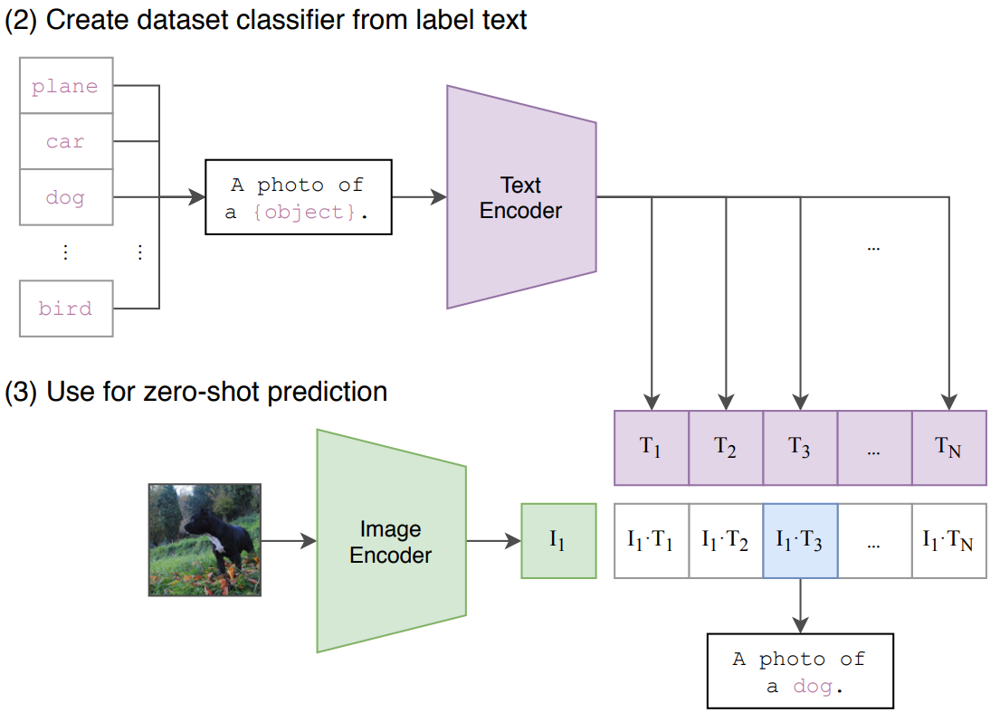

In [ ]:
caltech_101 = load_dataset("flwrlabs/caltech101", split="train")

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/121M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/8677 [00:00<?, ? examples/s]

In [ ]:
class_names = "accordion,airplanes,anchor,ant,barrel,bass,beaver,binocular,bonsai,brain,brontosaurus,buddha,butterfly,camera,cannon,car_side,ceiling_fan,cellphone,chair,chandelier,cougar_body,cougar_face,crab,crayfish,crocodile,crocodile_head,cup,dalmatian,dollar_bill,dolphin,dragonfly,electric_guitar,elephant,emu,euphonium,ewer,Faces,Faces_easy,ferry,flamingo,flamingo_head,garfield,gerenuk,gramophone,grand_piano,hawksbill,headphone,hedgehog,helicopter,ibis,inline_skate,joshua_tree,kangaroo,ketch,lamp,laptop,Leopards,llama,lobster,lotus,mandolin,mayfly,menorah,metronome,minaret,Motorbikes,nautilus,octopus,okapi,pagoda,panda,pigeon,pizza,platypus,pyramid,revolver,rhino,rooster,saxophone,schooner,scissors,scorpion,sea_horse,snoopy,soccer_ball,stapler,starfish,stegosaurus,stop_sign,strawberry,sunflower,tick,trilobite,umbrella,watch,water_lilly,wheelchair,wild_cat,windsor_chair,wrench,yin_yang".split(",")

In [ ]:
def transform_fn_caltech(examples):
    examples["pixel_values"] = [
        test_image_transforms(image.convert("RGB")) for image in examples["image"]
    ]
    del examples["image"]

    examples["caption"] = [[f"A photo of a {class_names[idx]} ."] for idx in examples["label"]]
    caption = [captions[0] for captions in examples["caption"]]
    examples.update(tokenize(caption))
    return examples

In [ ]:
caltech_101_dataloader = DataLoader(caltech_101.with_transform(transform_fn_caltech), batch_size=32, shuffle=False)

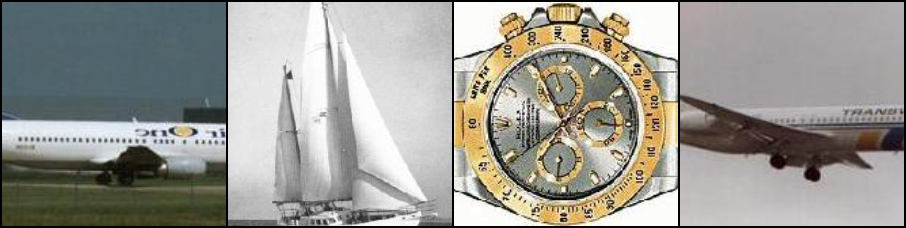

1. A photo of a airplanes .

1. A photo of a ketch .

1. A photo of a watch .

1. A photo of a airplanes .

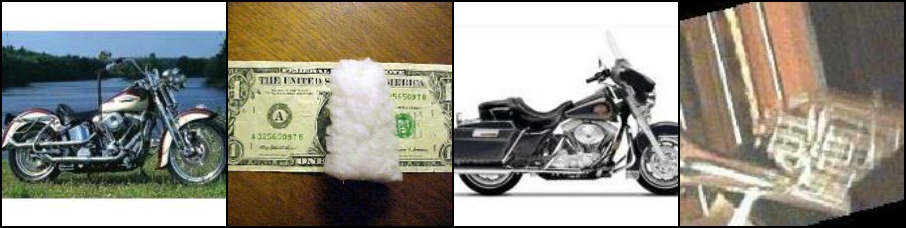

1. A photo of a Motorbikes .

1. A photo of a dollar_bill .

1. A photo of a Motorbikes .

1. A photo of a euphonium .

In [ ]:
x = next(iter(caltech_101_dataloader))
imgs = inv_normalize(x["pixel_values"]).clamp(0, 1)

display(to_pil_image(make_grid(imgs[:4])))
display(Markdown(f"1. {'\n\n1. '.join([x['caption'][0][i] for i in range(4)])}"))

display(to_pil_image(make_grid(imgs[4:8])))
display(Markdown(f"1. {'\n\n1. '.join([x['caption'][0][i] for i in range(4, 8)])}"))


In [ ]:
model.eval()
pass

In [ ]:
captions = [f"A photo of a {c} ." for c in class_names]
tokenized = tokenize(captions)

for k in ["input_ids", "attention_mask"]:
    tokenized[k] = tokenized[k].to(device)

text_embeddings = model.text_projection(model.text_encoder(**tokenized))

In [ ]:
correct_predictions = 0
total_samples = 0


with torch.no_grad():
    for batch in tqdm(caltech_101_dataloader):
        labels = batch["label"].to(device)
        image_features = model.image_encoder(batch["pixel_values"].to(device))
        image_embeddings = model.image_projection(image_features)

        logits = image_embeddings @ text_embeddings.T

        predictions = torch.argmax(logits, dim=-1)
        correct_predictions += (predictions == labels).sum().item()
        total_samples += labels.size(0)

    accuracy = correct_predictions / total_samples
    print(f"Zero-shot Accuracy na Caltech-101: {accuracy:.2%}")

100%|██████████| 272/272 [01:04<00:00,  4.22it/s]

Zero-shot Accuracy na Caltech-101: 24.42%


### Zero-shot Accuracy na Caltech-101:
- Losowo zainicjalizowany model (przed uczeniem): **1.20%**
- Model po treningu na Flickr30k: **24.36%**

### Przykłady

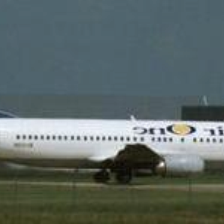

A photo of a airplanes:	0.027
A photo of a ibis:	0.0258
A photo of a hawksbill:	0.0202
A photo of a flamingo:	0.0193
A photo of a helicopter:	0.0185


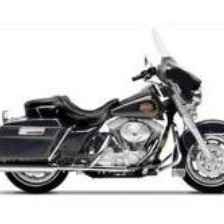

A photo of a wrench:	0.0174
A photo of a Motorbikes:	0.0173
A photo of a grand_piano:	0.0162
A photo of a sea_horse:	0.0146
A photo of a car_side:	0.0142


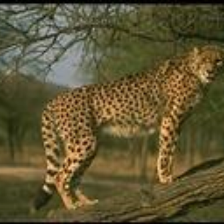

A photo of a crocodile:	0.0198
A photo of a elephant:	0.0192
A photo of a llama:	0.0192
A photo of a panda:	0.0181
A photo of a Leopards:	0.0178


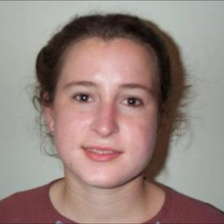

A photo of a Faces:	0.0231
A photo of a menorah:	0.0193
A photo of a gerenuk:	0.0181
A photo of a strawberry:	0.0171
A photo of a barrel:	0.0168


In [ ]:
x = next(iter(caltech_101_dataloader))
ids = [0, 6, 19, 20]
for idx in ids:
    display(to_pil_image(inv_normalize(x["pixel_values"][idx])))

    image_features = model.image_encoder(x["pixel_values"][idx, None].to(device))
    image_embeddings = model.image_projection(image_features)
    logits = image_embeddings @ text_embeddings.T

    probs = F.softmax(logits, dim=-1)

    pairs = []

    for class_name, prob in zip(class_names, probs.squeeze().cpu().tolist()):
        pairs.append((f"A photo of a {class_name}", prob))

    pairs.sort(key=lambda x: x[1], reverse=True)
    for label, logit in pairs[:5]:
        print(f"{label}:\t{logit:.3}")